This file is meant to cover the challenge in class 4.3.6 regarding RBM. It uses 
1. a data set from fastai and 
2. an RBM class that uses tensorflow from the link below (modified to work with tensorflow 1.5 and a few other relatively minor changes)

The data it uses is a collection of pictures of cats, which I converted into 100x100 black and which pictures for the purposes of this exercise (to use binary RBM).

RBM class from https://gist.github.com/blackecho/db85fab069bd2d6fb3e7.js

In [75]:
import os
import sys
# to be able to use the RBM class we need a couple of .py files in the current directory. 
module_path = os.path.abspath(os.path.join('.'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [ ]:
# del sys.modules['zconfig']
# del sys.modules['utilsRBM']

In [76]:
import tensorflow as tf
import numpy as np

import zconfig
import utilsRBM

from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# RBM class

In [77]:
class RBM(object):

    """ Restricted Boltzmann Machine implementation using TensorFlow.
    The interface of the class is sklearn-like.
    """

    def __init__(self, num_visible, num_hidden, visible_unit_type='bin', main_dir='rbm', model_name='rbm_model',
                 gibbs_sampling_steps=1, learning_rate=0.01, batch_size=10, num_epochs=10, stddev=0.1, verbose=0):

        """
        :param num_visible: number of visible units
        :param num_hidden: number of hidden units
        :param visible_unit_type: type of the visible units (binary or gaussian)
        :param main_dir: main directory to put the models, data and summary directories
        :param model_name: name of the model, used to save data
        :param gibbs_sampling_steps: optional, default 1
        :param learning_rate: optional, default 0.01
        :param batch_size: optional, default 10
        :param num_epochs: optional, default 10
        :param stddev: optional, default 0.1. Ignored if visible_unit_type is not 'gauss'
        :param verbose: level of verbosity. optional, default 0
        """

        self.num_visible = num_visible
        self.num_hidden = num_hidden
        self.visible_unit_type = visible_unit_type
        self.main_dir = main_dir
        self.model_name = model_name
        self.gibbs_sampling_steps = gibbs_sampling_steps
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.num_epochs = num_epochs
        self.stddev = stddev
        self.verbose = verbose

        self.models_dir, self.data_dir, self.summary_dir = self._create_data_directories()
        self.model_path = self.models_dir + self.model_name

        self.W = None
        self.bh_ = None
        self.bv_ = None

        self.w_upd8 = None
        self.bh_upd8 = None
        self.bv_upd8 = None

        self.encode = None

        self.loss_function = None

        self.input_data = None
        self.hrand = None
        self.vrand = None
        self.validation_size = None

        self.tf_merged_summaries = None
        self.tf_summary_writer = None
        self.tf_session = None
        self.tf_saver = None

    def fit(self, train_set, validation_set=None, restore_previous_model=False):

        """ Fit the model to the training data.
        :param train_set: training set
        :param validation_set: validation set. optional, default None
        :param restore_previous_model:
                    if true, a previous trained model
                    with the same name of this model is restored from disk to continue training.
        :return: self
        """

        if validation_set is not None:
            self.validation_size = validation_set.shape[0]

        self._build_model()

        with tf.Session() as self.tf_session:

            self._initialize_tf_utilities_and_ops(restore_previous_model)
            self._train_model(train_set, validation_set)
            self.tf_saver.save(self.tf_session, self.model_path)

    def _initialize_tf_utilities_and_ops(self, restore_previous_model):

        """ Initialize TensorFlow operations: summaries, init operations, saver, summary_writer.
        Restore a previously trained model if the flag restore_previous_model is true.
        """

        self.tf_merged_summaries = tf.summary.merge_all()
        init_op = tf.global_variables_initializer() # tf.initialize_all_variables()
        self.tf_saver = tf.train.Saver()

        self.tf_session.run(init_op)

        if restore_previous_model:
            self.tf_saver.restore(self.tf_session, self.model_path)

        self.tf_summary_writer = tf.summary.FileWriter(self.summary_dir, self.tf_session.graph_def)

    def _train_model(self, train_set, validation_set):

        """ Train the model.
        :param train_set: training set
        :param validation_set: validation set. optional, default None
        :return: self
        """

        for i in range(self.num_epochs):
            self._run_train_step(train_set)

            if validation_set is not None:
                self._run_validation_error_and_summaries(i, validation_set)

    def _run_train_step(self, train_set):

        """ Run a training step. A training step is made by randomly shuffling the training set,
        divide into batches and run the variable update nodes for each batch.
        :param train_set: training set
        :return: self
        """

        np.random.shuffle(train_set)

        batches = [_ for _ in utilsRBM.gen_batches(train_set, self.batch_size)]
        updates = [self.w_upd8, self.bh_upd8, self.bv_upd8]

        for batch in batches:
            self.tf_session.run(updates, feed_dict=self._create_feed_dict(batch))

    def _run_validation_error_and_summaries(self, epoch, validation_set):

        """ Run the summaries and error computation on the validation set.
        :param epoch: current epoch
        :param validation_set: validation data
        :return: self
        """

        result = self.tf_session.run([self.tf_merged_summaries, self.loss_function],
                                     feed_dict=self._create_feed_dict(validation_set))

        summary_str = result[0]
        err = result[1]

        self.tf_summary_writer.add_summary(summary_str, 1)

        if self.verbose == 1:
            print("Validation cost at step %s: %s" % (epoch, err))

    def _create_feed_dict(self, data):

        """ Create the dictionary of data to feed to TensorFlow's session during training.
        :param data: training/validation set batch
        :return: dictionary(self.input_data: data, self.hrand: random_uniform, self.vrand: random_uniform)
        """

        return {
            self.input_data: data,
            self.hrand: np.random.rand(data.shape[0], self.num_hidden),
            self.vrand: np.random.rand(data.shape[0], self.num_visible)
        }

    def _build_model(self):

        """ Build the Restricted Boltzmann Machine model in TensorFlow.
        :return: self
        """

        self.input_data, self.hrand, self.vrand = self._create_placeholders()
        self.W, self.bh_, self.bv_ = self._create_variables()

        hprobs0, hstates0, vprobs, hprobs1, hstates1 = self.gibbs_sampling_step(self.input_data)
        positive = self.compute_positive_association(self.input_data, hprobs0, hstates0)

        nn_input = vprobs

        for step in range(self.gibbs_sampling_steps - 1):
            hprobs, hstates, vprobs, hprobs1, hstates1 = self.gibbs_sampling_step(nn_input)
            nn_input = vprobs

        negative = tf.matmul(tf.transpose(vprobs), hprobs1)

        self.encode = hprobs1  # encoded data, used by the transform method

        self.w_upd8 = self.W.assign_add(self.learning_rate * (positive - negative))
        self.bh_upd8 = self.bh_.assign_add(self.learning_rate * tf.reduce_mean(hprobs0 - hprobs1, 0))
        self.bv_upd8 = self.bv_.assign_add(self.learning_rate * tf.reduce_mean(self.input_data - vprobs, 0))

        self.loss_function = tf.sqrt(tf.reduce_mean(tf.square(self.input_data - vprobs)))
        _ = tf.summary.scalar("cost", self.loss_function)

    def _create_placeholders(self):

        """ Create the TensorFlow placeholders for the model.
        :return: tuple(input(shape(None, num_visible)),
                       hrand(shape(None, num_hidden))
                       vrand(shape(None, num_visible)))
        """

        x = tf.placeholder('float', [None, self.num_visible], name='x-input')
        hrand = tf.placeholder('float', [None, self.num_hidden], name='hrand')
        vrand = tf.placeholder('float', [None, self.num_visible], name='vrand')

        return x, hrand, vrand

    def _create_variables(self):

        """ Create the TensorFlow variables for the model.
        :return: tuple(weights(shape(num_visible, num_hidden),
                       hidden bias(shape(num_hidden)),
                       visible bias(shape(num_visible)))
        """

        W = tf.Variable(tf.random_normal((self.num_visible, self.num_hidden), mean=0.0, stddev=0.01), name='weights')
        bh_ = tf.Variable(tf.zeros([self.num_hidden]), name='hidden-bias')
        bv_ = tf.Variable(tf.zeros([self.num_visible]), name='visible-bias')

        return W, bh_, bv_

    def gibbs_sampling_step(self, visible):

        """ Performs one step of gibbs sampling.
        :param visible: activations of the visible units
        :return: tuple(hidden probs, hidden states, visible probs,
                       new hidden probs, new hidden states)
        """

        hprobs, hstates = self.sample_hidden_from_visible(visible)
        vprobs = self.sample_visible_from_hidden(hprobs)
        hprobs1, hstates1 = self.sample_hidden_from_visible(vprobs)

        return hprobs, hstates, vprobs, hprobs1, hstates1

    def sample_hidden_from_visible(self, visible):

        """ Sample the hidden units from the visible units.
        This is the Positive phase of the Contrastive Divergence algorithm.
        :param visible: activations of the visible units
        :return: tuple(hidden probabilities, hidden binary states)
        """

        hprobs = tf.nn.sigmoid(tf.matmul(visible, self.W) + self.bh_)
        hstates = utilsRBM.sample_prob(hprobs, self.hrand)

        return hprobs, hstates

    def sample_visible_from_hidden(self, hidden):

        """ Sample the visible units from the hidden units.
        This is the Negative phase of the Contrastive Divergence algorithm.
        :param hidden: activations of the hidden units
        :return: visible probabilities
        """

        visible_activation = tf.matmul(hidden, tf.transpose(self.W)) + self.bv_

        if self.visible_unit_type == 'bin':
            vprobs = tf.nn.sigmoid(visible_activation)

        elif self.visible_unit_type == 'gauss':
            vprobs = tf.truncated_normal((1, self.num_visible), mean=visible_activation, stddev=self.stddev)

        else:
            vprobs = None

        return vprobs

    def compute_positive_association(self, visible, hidden_probs, hidden_states):

        """ Compute positive associations between visible and hidden units.
        :param visible: visible units
        :param hidden_probs: hidden units probabilities
        :param hidden_states: hidden units states
        :return: positive association = dot(visible.T, hidden)
        """

        if self.visible_unit_type == 'bin':
            positive = tf.matmul(tf.transpose(visible), hidden_states)

        elif self.visible_unit_type == 'gauss':
            positive = tf.matmul(tf.transpose(visible), hidden_probs)

        else:
            positive = None

        return positive

    def _create_data_directories(self):

        """ Create the three directories for storing respectively the models,
        the data generated by training and the TensorFlow's summaries.
        :return: tuple of strings(models_dir, data_dir, summary_dir)
        """

        self.main_dir = self.main_dir + '/' if self.main_dir[-1] != '/' else self.main_dir

        models_dir = self.main_dir + zconfig.models_dir
        data_dir = self.main_dir + zconfig.data_dir 
        summary_dir = self.main_dir + zconfig.summary_dir

        for d in [models_dir, data_dir, summary_dir]:
            if not os.path.isdir(d):
                os.mkdir(d)

        return models_dir, data_dir, summary_dir

    def transform(self, data, name='train', save=False):

        """ Transform data according to the model.
        :type data: array_like
        :param data: Data to transform
        :type name: string, default 'train'
        :param name: Identifier for the data that is being encoded
        :type save: boolean, default 'False'
        :param save: If true, save data to disk
        :return: transformed data
        """

        with tf.Session() as self.tf_session:

            self.tf_saver.restore(self.tf_session, self.model_path)

            encoded_data = self.encode.eval(self._create_feed_dict(data))

            if save:
                np.save(self.data_dir + self.model_name + '-' + name, encoded_data)

            return encoded_data

    def load_model(self, shape, gibbs_sampling_steps, model_path):

        """ Load a trained model from disk. The shape of the model
        (num_visible, num_hidden) and the number of gibbs sampling steps
        must be known in order to restore the model.
        :param shape: tuple(num_visible, num_hidden)
        :param gibbs_sampling_steps:
        :param model_path:
        :return: self
        """

        self.num_visible, self.num_hidden = shape[0], shape[1]
        self.gibbs_sampling_steps = gibbs_sampling_steps

        self._build_model()

        init_op = tf.initialize_all_variables()
        self.tf_saver = tf.train.Saver()

        with tf.Session() as self.tf_session:

            self.tf_session.run(init_op)
            self.tf_saver.restore(self.tf_session, model_path)

    def get_model_parameters(self):

        """ Return the model parameters in the form of numpy arrays.
        :return: model parameters
        """

        with tf.Session() as self.tf_session:

            self.tf_saver.restore(self.tf_session, self.model_path)

            return {
                'W': self.W.eval(),
                'bh_': self.bh_.eval(),
                'bv_': self.bv_.eval()
            }

    def get_weights_as_images(self, width, height, outdir='img/', n_images=10, img_type='grey', sampleRand=True):

        """ Create and save the weights of the hidden units with respect to the
        visible units as images.
        :param width:
        :param height:
        :param outdir:
        :param n_images:
        :param img_type:
        :return: self
        """

        outdir = self.data_dir + outdir

        with tf.Session() as self.tf_session:

            self.tf_saver.restore(self.tf_session, self.model_path)

            weights = self.W.eval()

            if sampleRand:
                perm = np.random.permutation(self.num_hidden)[:n_images]
            else: 
                perm = np.arange(n_images)

            for p in perm:
                w = np.array([i[p] for i in weights])
                image_path = outdir + self.model_name + '_{}.png'.format(p)
                utilsRBM.gen_image(w, width, height, image_path, img_type)

In [78]:
def plot_features(n_pic_plots, model_name_str):
    n_rows = int(np.ceil(n_pic_plots/10))

    plt.figure(figsize=(20,2*n_rows))

    for ii in range(n_pic_plots):
        plt.subplot(n_rows,10,ii+1)
        img = mpimg.imread(f'./data/img/{model_name_str}_{ii}.png')
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    plt.show()

# Load and prepare data

In [79]:
PATH = "data2/"
reshapeSize = 10000
loadFolder = 'train/cats_bw'

In [80]:
files = os.listdir(f'{PATH}{loadFolder}')
files.remove('.ipynb_checkpoints')
imageData = np.zeros((len(files), reshapeSize))

In [81]:
for ff, ii in zip(files, range(len(files))):
    img = Image.open(f'{PATH}{loadFolder}/{ff}') 
    arr = np.asarray(img)
    arr2 = 0.5*(1.0+np.sign(arr/255-0.5))
    imageData[ii,:] = arr2.reshape(1,reshapeSize)

In [82]:
inputData = imageData.copy()

In [83]:
RBM_visible_sizes = 10000

# Run RBM - 10 hidden nodes + standard parameters

In [84]:
RBM_hidden_sizes = 10
model_name_str = 'cats_rbm_1'

In [85]:
rbm = RBM(RBM_visible_sizes, RBM_hidden_sizes,main_dir='./', model_name=model_name_str)

In [86]:
rbm.fit(inputData)

In [87]:
rbm.get_weights_as_images(width=100, height=100, n_images=RBM_hidden_sizes, sampleRand=False)

INFO:tensorflow:Restoring parameters from ./models/cats_rbm_1


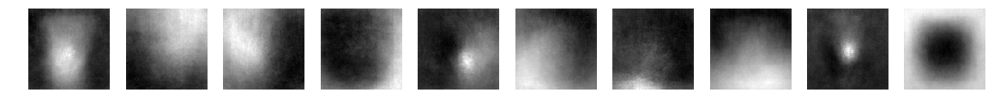

In [88]:
plot_features(RBM_hidden_sizes, model_name_str)

# Run RBM - 20 hidden nodes + standard parameters

In [89]:
RBM_hidden_sizes = 20
model_name_str = 'cats_rbm_2'

In [90]:
rbm2 = RBM(RBM_visible_sizes, RBM_hidden_sizes,main_dir='./', model_name=model_name_str)

In [91]:
rbm2.fit(inputData)

In [92]:
rbm2.get_weights_as_images(width=100, height=100, n_images=RBM_hidden_sizes, sampleRand=False)

INFO:tensorflow:Restoring parameters from ./models/cats_rbm_2


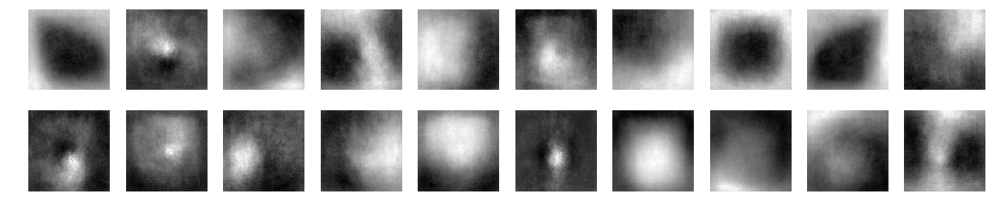

In [93]:
plot_features(RBM_hidden_sizes, model_name_str)

# Run RBM - 50 hidden nodes + standard parameters

In [94]:
RBM_hidden_sizes = 50
model_name_str = 'cats_rbm_5'

In [95]:
rbm5 = RBM(RBM_visible_sizes, RBM_hidden_sizes,main_dir='./', model_name=model_name_str)

In [96]:
rbm5.fit(inputData)

In [97]:
rbm5.get_weights_as_images(width=100, height=100, n_images=RBM_hidden_sizes, sampleRand=False)

INFO:tensorflow:Restoring parameters from ./models/cats_rbm_5


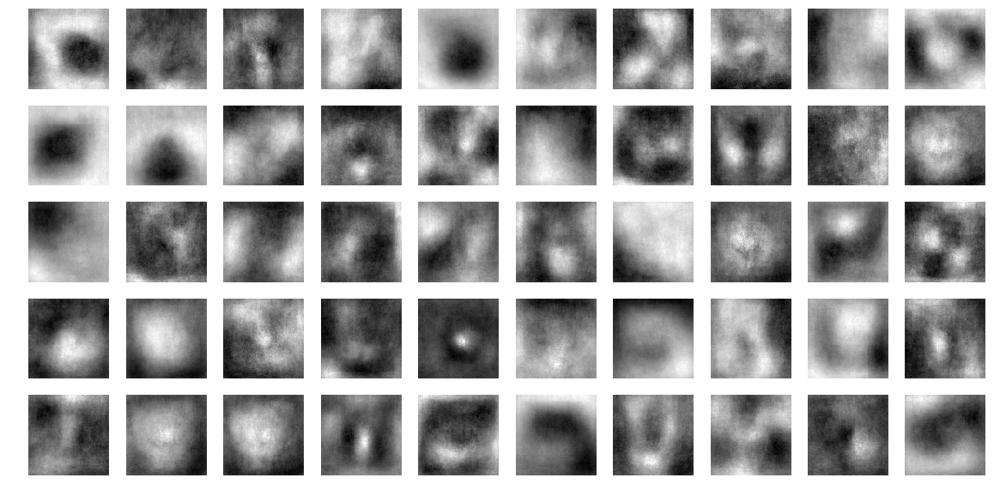

In [98]:
plot_features(RBM_hidden_sizes, model_name_str)

# Run RBM - 100 hidden nodes and standard parameters

In [99]:
RBM_hidden_sizes = 100
model_name_str = 'cats_rbm_10'

In [100]:
rbm10 = RBM(RBM_visible_sizes, RBM_hidden_sizes,main_dir='./', model_name=model_name_str)

In [101]:
rbm10.fit(inputData)

In [102]:
rbm10.get_weights_as_images(width=100, height=100, n_images=RBM_hidden_sizes, sampleRand=False)

INFO:tensorflow:Restoring parameters from ./models/cats_rbm_10


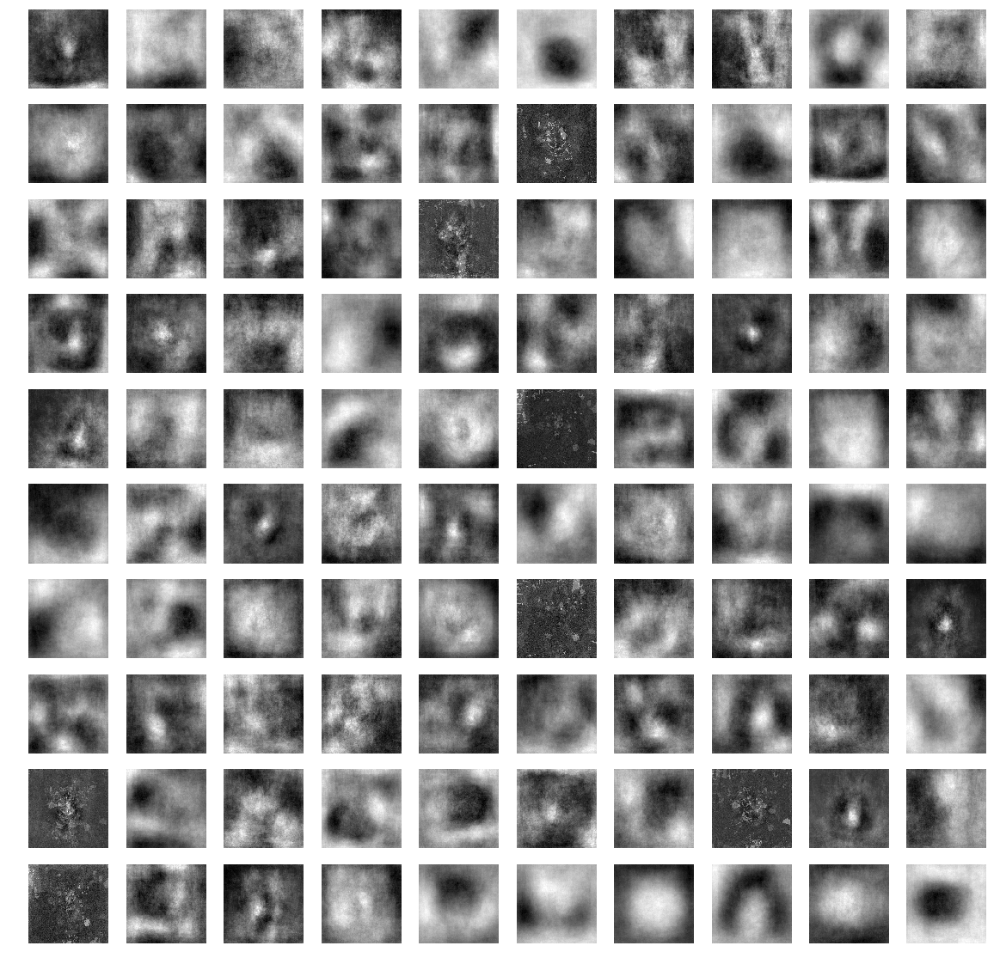

In [103]:
plot_features(RBM_hidden_sizes, model_name_str)

# Run RBM - 500 hidden nodes and standard parameters 

In [104]:
RBM_hidden_sizes = 500
model_name_str = 'cats_rbm_50'

In [105]:
rbm50 = RBM(RBM_visible_sizes, RBM_hidden_sizes,main_dir='./', model_name=model_name_str)

In [106]:
rbm50.fit(inputData)

In [107]:
rbm50.get_weights_as_images(width=100, height=100, n_images=RBM_hidden_sizes, sampleRand=False)

INFO:tensorflow:Restoring parameters from ./models/cats_rbm_50


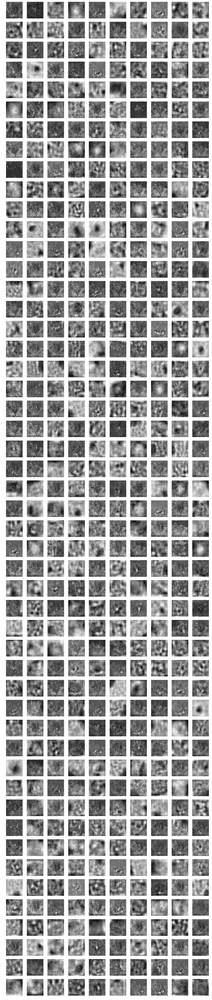

In [108]:
plot_features(RBM_hidden_sizes, model_name_str)

# Run RBM - 100 hidden nodes + 50 epochs 

In [109]:
RBM_hidden_sizes = 100
model_name_str = 'cats_1_rbm_10'

In [110]:
rbm10_1 = RBM(RBM_visible_sizes, RBM_hidden_sizes,main_dir='./', model_name=model_name_str, num_epochs=50, verbose=1)

In [113]:
rbm10_1.fit(train_set=inputData)

In [114]:
rbm10_1.get_weights_as_images(width=100, height=100, n_images=RBM_hidden_sizes, sampleRand=False)

INFO:tensorflow:Restoring parameters from ./models/cats_1_rbm_10


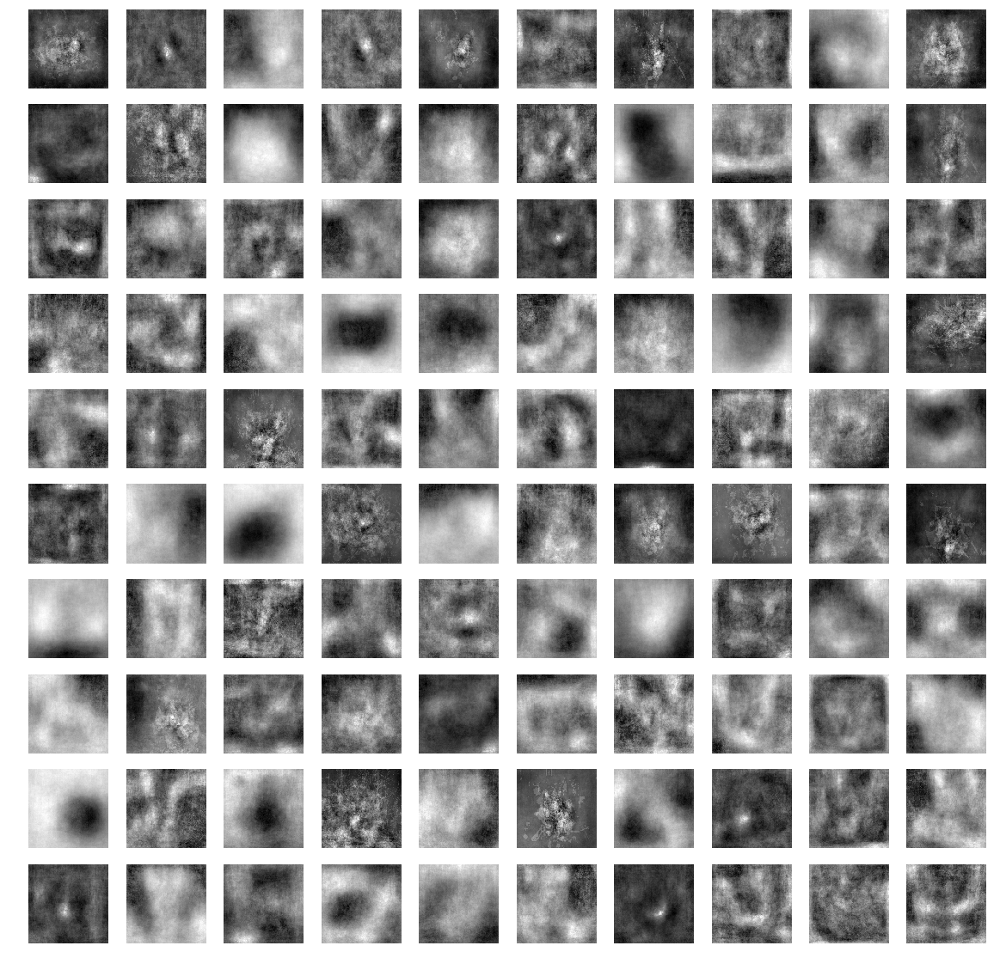

In [115]:
plot_features(RBM_hidden_sizes, model_name_str)

# Questions

0. How do I tell whether I am doing a good job, especially since it is unsupervised?

1. How does the RBM deal with the possibility that the item(e.g. cat) you care about may not be in the same place? Does that throw off the RBM? Do CNNs handle this type of possibility better because they have the convolution in there and average out over pixels?

2. How does the RBM deal with the fact that the colors may swich meaning (i.e. sometimes the cat is black and the background is white, sometimes the reverse and some times the opposite)? 

3. Is there a way in which one can sort the features found by importance?

4. In my understanding RBM works with binary input. Can you also apply it to non-binary input and how? (the class above does work with gaussian input)
